# Input Functions, esp. for [15O]Oxygen and Mintun1984 Models
## Setup

In [1]:
import os
import sys
sys.path.append(os.path.abspath(os.path.join(os.getcwd(), os.pardir)))

In [2]:
# system functions that are always useful to have
import time
from pprint import pprint

# basic numeric setup
import numpy as np

from RadialArteryContext import RadialArteryContext

%matplotlib inline

In [3]:
# define data & models
kerndir = os.path.join(os.getenv("HOME"), "PycharmProjects", "dynesty", "idif2024", "data", "kernels")
petdir = os.path.join(os.getenv("HOME"), "PycharmProjects", "dynesty", "idif2024", "data", "ses-20210421150523", "pet")
petdir2 = os.path.join(os.getenv("HOME"), "PycharmProjects", "dynesty", "idif2024", "data", "ses-20210421154248", "pet")
idif = os.path.join(petdir, "sub-108293_ses-20210421150523_trc-oo_proc-MipIdif_idif.nii.gz")
idif2 = os.path.join(petdir2, "sub-108293_ses-20210421154248_trc-oo_proc-MipIdif_idif.nii.gz")
twil = os.path.join(petdir, "sub-108293_ses-20210421150523_trc-oo_proc-TwiliteKit-do-make-input-func-nomodel_inputfunc.nii.gz")
twil2 = os.path.join(petdir2, "sub-108293_ses-20210421154248_trc-oo_proc-TwiliteKit-do-make-input-func-nomodel_inputfunc.nii.gz")
kern = os.path.join(kerndir, "kernel_hct=46.8.nii.gz")

# For IDIF:  1st two Schaeffer parcels
pet = os.path.join(petdir, "sub-108293_ses-20210421150523_trc-oo_proc-delay0-BrainMoCo2-createNiftiMovingAvgFrames-ParcSchaeffer-reshape-to-schaeffer-2parcs.nii.gz")
# For IDIF:  only four Schaeffer parcels 
pet2 = os.path.join(petdir2, "sub-108293_ses-20210421154248_trc-oo_proc-delay0-BrainMoCo2-createNiftiMovingAvgFrames_timeAppend-4-ParcSchaeffer-reshape-to-schaeffer-select-4.nii.gz")


### Defining truths for Artery

```
v[0] = u[0] * 30                                    # t_0  
v[1] = u[1] * 30                                    # \tau_2 ~ t_2 - t_0  
v[2] = u[2] * 30                                    # \tau_3 ~ t_3 - t_2  

v[3] = u[3] * 20                                    # \alpha - 1  
v[4] = u[4] * 30 + 1                                # 1/\beta  
v[5] = u[5] * 2.715 + 0.618                         # p  
v[6] = u[6] * 10/3 - 10/3                           # \delta p_2 ~ p_2 - p  
v[7] = u[7] * 10/3 - 10/3                           # \delta p_3 ~ p_3 - p_2  
v[8] = u[8] * Artery.duration + 1/Artery.duration   # 1/\gamma for s.s.  

v[9] = u[9] * 0.5                                   # f_2  
v[10] = u[10] * 0.5                                 # f_3  
v[11] = u[11] * 0.5                                 # f_{ss}  

v[12] = u[12] * 4 + 0.5                             # A is amplitude adjustment  

v[13] = u[13] * Artery.sigma                        # sigma ~ fraction of M0
```

In [4]:
truths_twil = [
    18.1405, 7.2114, 15.7225,
    3.4724, 3.8887, 2.9309, -1.4111, -1.9723, 732.1287,
    0.3583, 0.0512, 0.2570,
    2.5246,
    0.0373]

truths_twil2 = [
    0.8799, 25.6454, 14.7950,
    3.7346, 8.9966, 1.3895, -0.3961, -1.6927, 731.7475, 
    0.0752, 0.0875, 0.2348,
    2.5395, 
    0.0375]

truths_idif = [
    10.2470, 29.5557, 14.4955,
    0.7034, 7.9721, 1.2702, -1.8154, -1.3315, 196.1650,
    0.1356, 0.0074, 0.2352, 
    2.4554,
    0.0100]

truths_idif2 = [
    5.1572, 0.2203, 15.1573,
    4.6993, 10.8249, 2.9716, -1.9044, -0.0699, 0.6011,
    0.0801, 0.4960, 0.2438,
    2.3751,
    0.0100]

# Inspect RadialArtery

In [5]:
dd = {
    "input_func_fqfn": twil,
    "kernel_fqfn": kern,
    "tag": "playground_ra"
}
ra = RadialArteryContext(dd)

dd2 = {
    "input_func_fqfn": twil2,
    "kernel_fqfn": kern,
    "tag": "playground_ra2"
}
ra2 = RadialArteryContext(dd2)


### Plot RadialArtery ra

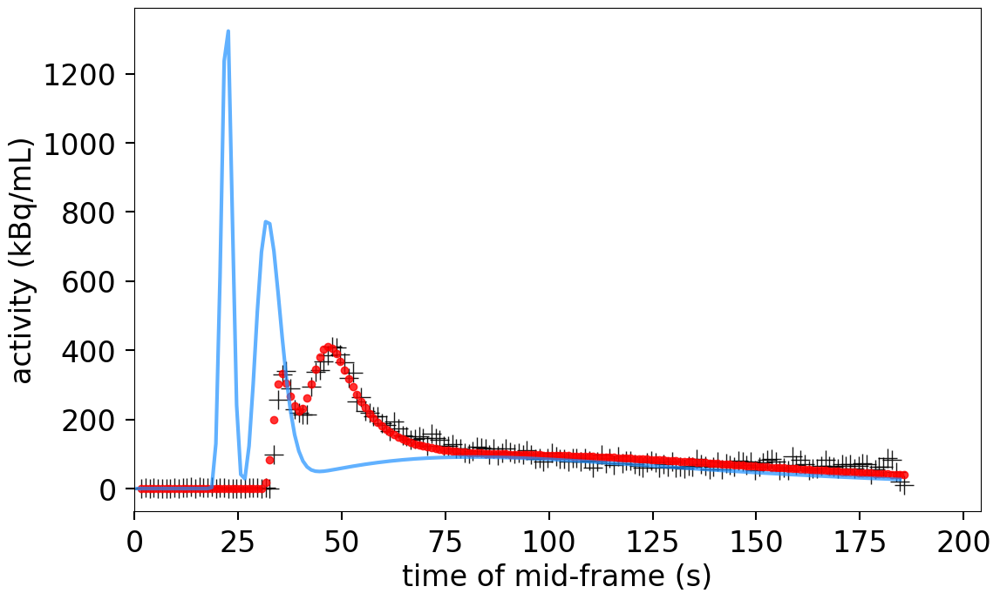

In [6]:
ra.plotting.plot_truths(truths_twil)

### Let's sample from this distribution of ra using the default `dynesty` settings with `'slice'`.

Previously, 4bolus model with t^(alpha - 1) gave:  
    # iter: 23900 | batch: 6 | bound: 22 | nc: 1 | ncall: 2130740 | eff(%):  1.107 |   
    # loglstar: 385.219 < 396.293 < 393.275 | logz: 347.713 +/-  0.256 | stop:  0.912  

20986it [01:35, 220.59it/s, batch: 7 | bound: 22 | nc: 1 | ncall: 1833948 | eff(%):  1.127 | loglstar: 340.765 < 350.488 < 348.986 | logz: 315.378 +/-  0.202 | stop:  0.878]           


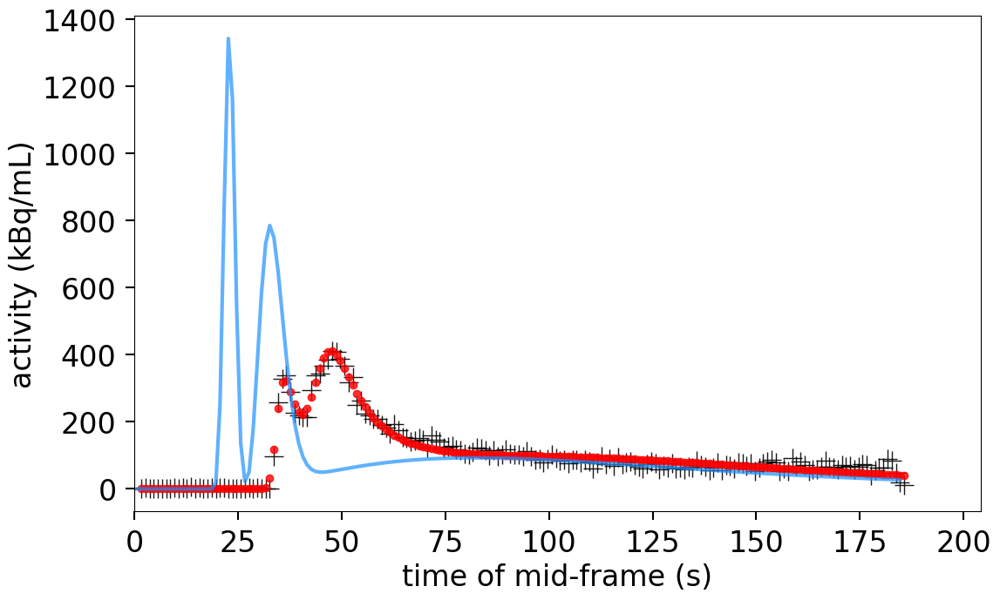

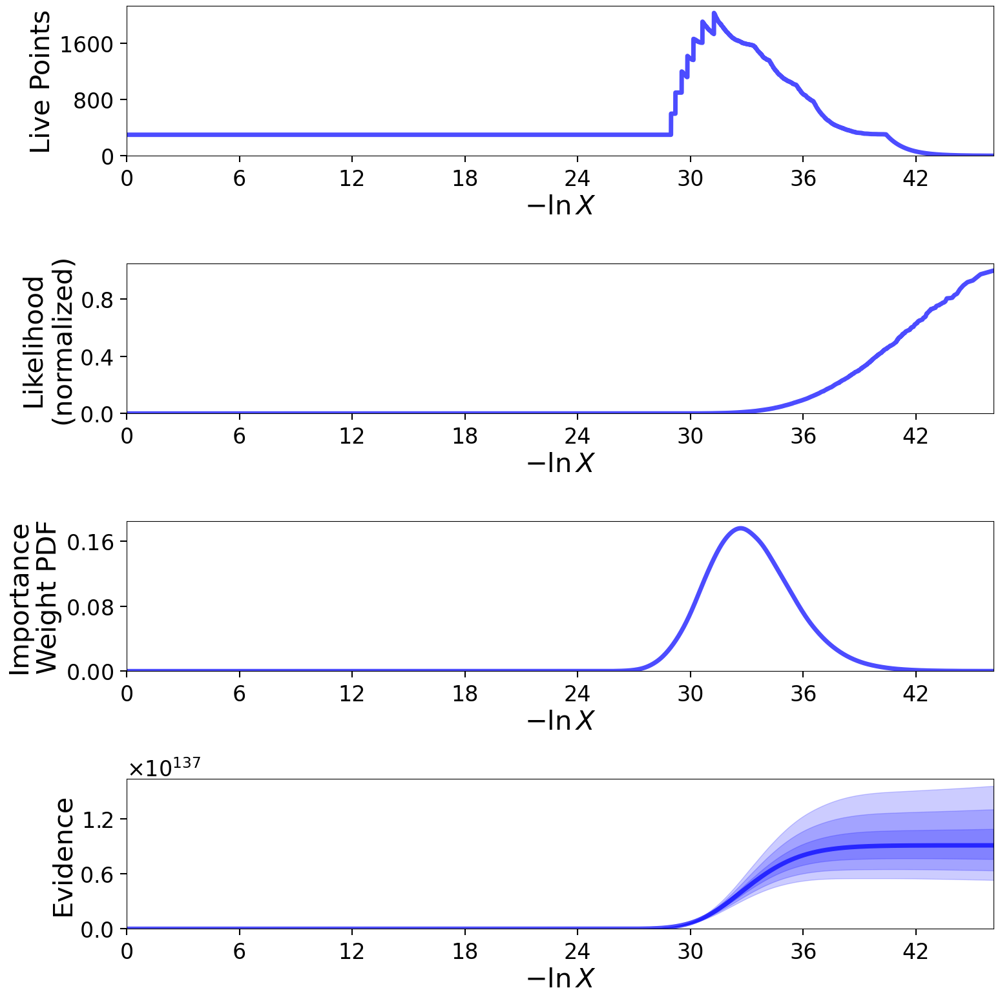

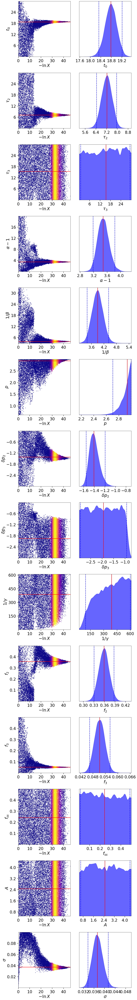

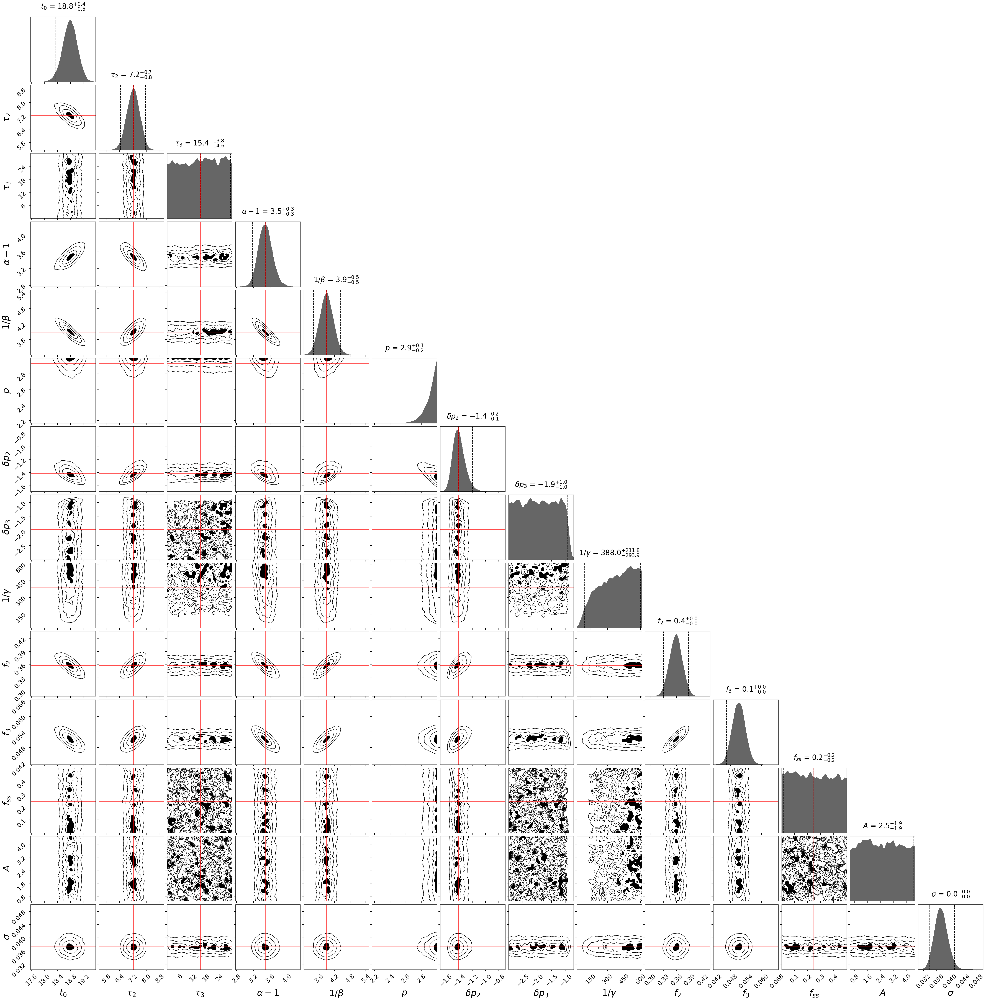

In [7]:
results_ra = ra.solver.run_nested(print_progress=True)
ra.plotting.plot_results()

### Plot RadialArtery ra2

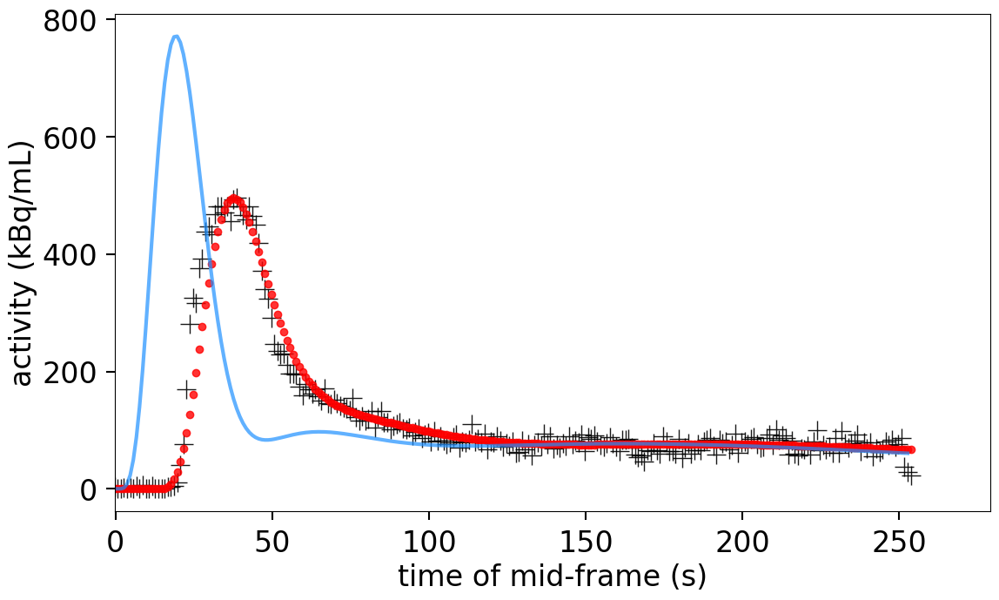

In [8]:
ra2.plotting.plot_truths(truths_twil2)

### Let's sample from this distribution of ra2 using the default `dynesty` settings with `'slice'`.

Previously, 4bolus model with t^(alpha - 1) gave:  
    # iter: 21353 | batch: 6 | bound: 18 | nc: 1 | ncall: 1934903 | eff(%):  1.088 |   
    # loglstar: 566.177 < 576.756 < 573.520 | logz: 535.749 +/-  0.234 | stop:  0.968  

In [9]:
results_ra2  = ra2.solver.run_nested(print_progress=True)
ra2.plotting.plot_results()


18249it [01:42, 227.77it/s, batch: 3 | bound: 2 | nc: 1 | ncall: 1631280 | eff(%):  1.100 | loglstar: 490.694 < 491.682 < 491.567 | logz: 450.508 +/-  0.312 | stop:  2.057]            

In [ ]:
ra.data.print_data()
ra2.data.print_data()